##### top

# FMP modelling for checking floor effect

This notebook runs Bayesian models on Datasets 1, 2, 3 and Concatenated Dataset 123 to assess interaction between perception and memory difficulty levels in the FMP. We fit the following formulas to mean score within the condition. Throughout the notebook, I use `task` as a term for memory difficulty levels (M, UD, FD-e), `difficulty` as a term for perceptual difficulty levels (1, 2, 3), and `userID` as a variable denoting individual participants.

* Model task (memory level) and difficulty (perceptual level) interaction with user (participant) as a random effect. Equation:
    * _correct_flt ~ task * difficulty + (1|userID)_
* Model task and difficulty as main effects without interaction with user as a random effect. Equation:
    * _correct_flt ~ task + difficulty + (1|userID)_

The datasets bear the same names as in the article:
* `dataset_1`
* `dataset_2` - randomised stimuli matched for entropy
* `dataset_3` - randomising cue stimulus
* and a new dataset that is a concatenation of the three datasets above -> `concat_datasets_123`

---

Specifically here, we test whether there is a floor effect (restricted range) that would be causing the reduced slope in FD-e. For that, we select participants in the 25-75% percentile range based on their overall score (FM, UD and FD-e, average). This is to satisfy Jesse's wish.

The results are once again skewing the population, now towards selecting too good people and creating an artificial ceiling effect in FM. This then ruins or complicates (no) interactions between FM and UD.

---

* [Models](#Models)
* [Plot results](#Plot-results)
* [Compare all data](#Compare-all-data)
* [Save the inference](#Save-the-inference)

In [1]:
import os, sys
import pickle
from os.path import join as opj
import arviz as az
import bambi as bmb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

az.style.use("arviz-darkgrid")
SEED = 7355608


# Importing module for functions
functions_modul =  "./functions"
sys.path.insert(0, functions_modul)

# import all processing and plotting functions
from bayesian_modelling_functions import fit_model, print_model

path_general = "../"
path_data = opj(path_general, "Data", "datasets")
path_inference_data = opj(path_general, "Data", "model_inference_data")


# set the numer of CPU
num_cpu = min(4, os.cpu_count()-1)
print(f'We will have {num_cpu} cores.\n')


path_dic = {
    'dataset_1' : opj(path_data, 'FMP_dataset_1.csv'),
    'dataset_2': opj(path_data, 'FMP_dataset_2.csv'),
    'dataset_3': opj(path_data, 'FMP_dataset_3.csv'),
    'concat_datasets_123': opj(path_data, 'FMP_concat_datasets_123.csv'),
#     'dataset_4': opj(path_data, 'FMP_dataset_4.csv'),
}


#####
# rename the levels
rename_tasks_dic = {'perception':'Matching', 'perc':'Matching', 'blank':'Unfilled Delay', 'faces':'Filled Delay - emotions', 'math':'Filled Delay - math'}

# define orders
hue_order = ['Matching', 'Unfilled Delay', 'Filled Delay - emotions']
hue_order_math = ['Matching', 'Unfilled Delay', 'Filled Delay - emotions', 'Filled Delay - math']


# load all dataframes
df_dic = {}

# only selected cols
select_cols = ['stim1', 'stim2', 'target', 'RT', 'userID', 'difficulty', 'levels', 'task', 'correct_flt', 'order']


for f in path_dic.keys():   
    if 'longitudinal_' in f or f=='dataset_3':
        df_dic[f] = pd.read_csv(path_dic[f], usecols=select_cols+['target_loc', 'target_loc_simple'])
    else:
        df_dic[f] = pd.read_csv(path_dic[f], usecols=select_cols)
    
    df_dic[f]["Experiment"] = f
    
    # rename the memory task labels in the df
    df_dic[f]['task'] = df_dic[f]['task'].map(rename_tasks_dic).fillna(df_dic[f]['task'])
        

    # clean
    df_dic[f].reset_index(drop=True, inplace=True)
    
    if 'Unnamed: 0' in df_dic[f].columns:
        df_dic[f].drop('Unnamed: 0', inplace=True, axis=1)
        
    
    # find low performing participants - just a check, there should not be any
    tt = df_dic[f].loc[df_dic[f]['task'].isin(['face matching', 'perc', 'perception'])].groupby(['userID', 'difficulty']).correct_flt.mean()

    drop_ptc = tt[tt<=0.5].reset_index().userID.values
    print(f'\nIn {f} dropping {len(drop_ptc)} participants for low accuracy in FM.')
    print(tt[tt<=0.5])

    # and remove them
    df_dic[f] = df_dic[f].loc[~df_dic[f]['userID'].isin(drop_ptc)]
    # clean up
    drop_ptc, tt = None, None


We will have 4 cores.


In dataset_1 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In dataset_2 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In dataset_3 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In concat_datasets_123 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)


In [2]:
# create a special data
data = df_dic['concat_datasets_123'].copy()

# # get the mean
# mu_UD = data.loc[(data["task"]=="Unfilled Delay")&(data["difficulty"]==1)].correct_flt.mean()
# sd_UD = data.loc[(data["task"]=="Unfilled Delay")&(data["difficulty"]==1)].correct_flt.std()


# print the original acc
# print(f"Original UD acc: {mu_UD:.4f} ± {sd_UD:.4f}")

# select participants, take in the 25-75% percentile range overall
top_thr = 0.25
# matched_acc_ptc = data.groupby(['userID']).correct_flt.mean().sort_values()[np.ceil(674*(1-top_thr)).astype(int):].index.values
# matched_acc_ptc = list(set(data.userID)-set(data.groupby(['userID']).correct_flt.mean().sort_values()[:np.ceil(674*(top_thr)).astype(int)].index) - set(data.groupby(['userID']).correct_flt.mean().sort_values()[np.ceil(674*(1-top_thr)).astype(int):].index))
matched_acc_ptc = list(set(data.groupby(['userID']).correct_flt.mean().sort_values()[np.ceil(674*(top_thr)).astype(int):np.ceil(674*(1-top_thr)).astype(int)].index))


print(f"Selecting {len(matched_acc_ptc)} participants")
print("After selection:")

# select only specific datasets and prepare them
datasets2fit = ['dataset_1', 'dataset_2', 'dataset_3', 'concat_datasets_123']

for f in datasets2fit:
    data=None
    data = df_dic[f].copy()
    print(f)
    print(f"""  Unfilled Delay:
          {data.loc[data["userID"].isin(matched_acc_ptc)&(data["task"] == "Unfilled Delay")&(data["difficulty"] == 1)].correct_flt.mean():.2f}""")

    print(f"""  Filled Delay - emotions:
          {data.loc[data["userID"].isin(matched_acc_ptc)&(data["task"] == "Filled Delay - emotions")&(data["difficulty"] == 1)].correct_flt.mean():.2f}""")



Selecting 337 participants
After selection:
dataset_1
  Unfilled Delay:
          0.82
  Filled Delay - emotions:
          0.69
dataset_2
  Unfilled Delay:
          0.81
  Filled Delay - emotions:
          0.71
dataset_3
  Unfilled Delay:
          0.83
  Filled Delay - emotions:
          0.71
concat_datasets_123
  Unfilled Delay:
          0.82
  Filled Delay - emotions:
          0.70


In [3]:
# select only specific datasets and prepare them
datasets2fit = ['dataset_1', 'dataset_2', 'dataset_3', 'concat_datasets_123']

df_dic_fit = {}


for f in datasets2fit:
    data=None
    
    # groupby and make means for ptc and condition, select only the subset
    data = df_dic[f].loc[df_dic[f]["userID"].isin(matched_acc_ptc)].groupby(['userID', 'task', 'difficulty'], observed=True).correct_flt.mean().reset_index()

    # convert all variables to categories
    # categorical_cols = data.columns[data.dtypes == object].tolist() + ['difficulty']
    categorical_cols = ['userID', 'task', 'difficulty']
    for col in categorical_cols:
        if col == 'task':
            # specify the order that we want
            data[col] = pd.Categorical(data[col], categories=['Unfilled Delay', 'Matching', 'Filled Delay - emotions'], ordered=True)
            #['Unfilled Delay', 'Matching', 'Filled Delay - emotions']
            
            # also do it for the original datasets
            df_dic[f][col] = pd.Categorical(df_dic[f][col], categories=['Unfilled Delay', 'Matching', 'Filled Delay - emotions'], ordered=True)
        else:
            data[col] = data[col].astype("category")
            df_dic[f][col] = df_dic[f][col].astype("category")

    # check
    print('\n',f)
    df_dic[f].info()
    
    print(f'N={data.userID.unique().size}')
        
    # save
    df_dic_fit[f] = data.copy()

# # drop them for now
# data[data.correct_flt.isna()]


 dataset_1
<class 'pandas.core.frame.DataFrame'>
Index: 46620 entries, 0 to 46619
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   stim1        46620 non-null  object  
 1   stim2        46620 non-null  object  
 2   target       46620 non-null  object  
 3   RT           45500 non-null  float64 
 4   userID       46620 non-null  category
 5   task         46620 non-null  category
 6   order        46620 non-null  int64   
 7   difficulty   46620 non-null  category
 8   levels       46620 non-null  int64   
 9   correct_flt  45500 non-null  float64 
 10  Experiment   46620 non-null  object  
dtypes: category(3), float64(2), int64(2), object(4)
memory usage: 3.4+ MB
N=123

 dataset_2
<class 'pandas.core.frame.DataFrame'>
Index: 27540 entries, 0 to 27539
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   userID       27540 non-null  category

## Models
[top](#top)

In [4]:
model_assumptions = {
    "correct_flt ~ task * difficulty + (1|userID)": "Each user has their own baseline performance, but the effect of task and difficulty is assumed to be the same across all users.",
    "correct_flt ~ task + difficulty + (1|userID)": "Assumes that each user has their own baseline performance, but the effects of task and difficulty are consistent across all users without any interaction between task and difficulty.",
}

# define what we want to run
formulas2run = [
    "correct_flt ~ task * difficulty + (1|userID)",
    "correct_flt ~ task + difficulty + (1|userID)",
]

In [5]:
# define where we will store the results
model_dic_bernoulli = {}
result_dic_bernoulli = {}

for f in df_dic_fit.keys():
    print(f'\nFitting dataset {f}\n')
    # create datasets
    if f not in model_dic_bernoulli.keys():
        model_dic_bernoulli[f] = {}
    if f not in result_dic_bernoulli.keys():
        result_dic_bernoulli[f] = {}
    
    for formula in formulas2run:
        print(f'\nFitting formula {formula}\n')
    
        model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula] = fit_model(formula, df_dic_fit[f], categorical_cols,
                                                                                      num_cpu=num_cpu, check_priors=False, sample_priors=False)

Sampling 4 chains, 11 divergences ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00 / 0:00:24

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 24 seconds.
There were 11 divergences after tuning. Increase `target_accept` or reparameterize.


In [6]:
model_dic_bernoulli[f][formulas2run[0]]

       Formula: correct_flt ~ task * difficulty + (1|userID)
        Family: gaussian
          Link: mu = identity
  Observations: 3027
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.7668, sigma: 0.6261)
            task ~ Normal(mu: [0. 0.], sigma: [0.7098 0.7109])
            difficulty ~ Normal(mu: [0. 0.], sigma: [0.7102 0.7102])
            task:difficulty ~ Normal(mu: [0. 0. 0. 0.], sigma: [1.0643 1.0643 1.0671 1.0671])
        
        Group-level effects
            1|userID ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 0.6261))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 0.1339)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

In [7]:
model_dic_bernoulli[f][formulas2run[1]]

       Formula: correct_flt ~ task + difficulty + (1|userID)
        Family: gaussian
          Link: mu = identity
  Observations: 3027
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.7668, sigma: 0.5797)
            task ~ Normal(mu: [0. 0.], sigma: [0.7098 0.7109])
            difficulty ~ Normal(mu: [0. 0.], sigma: [0.7102 0.7102])
        
        Group-level effects
            1|userID ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 0.5797))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 0.1339)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

### check priors

Sampling: [1|userID_sigma, Intercept, difficulty, sigma, task, task:difficulty]


array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'task\nMatching'}>],
       [<Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'task:difficulty\nMatching, 2'}>,
        <Axes: title={'center': 'task:difficulty\nMatching, 3'}>,
        <Axes: title={'center': 'task:difficulty\nFilled Delay - emotions, 2'}>],
       [<Axes: title={'center': 'task:difficulty\nFilled Delay - emotions, 3'}>,
        <Axes: title={'center': '1|userID_sigma'}>, <Axes: >]],
      dtype=object)

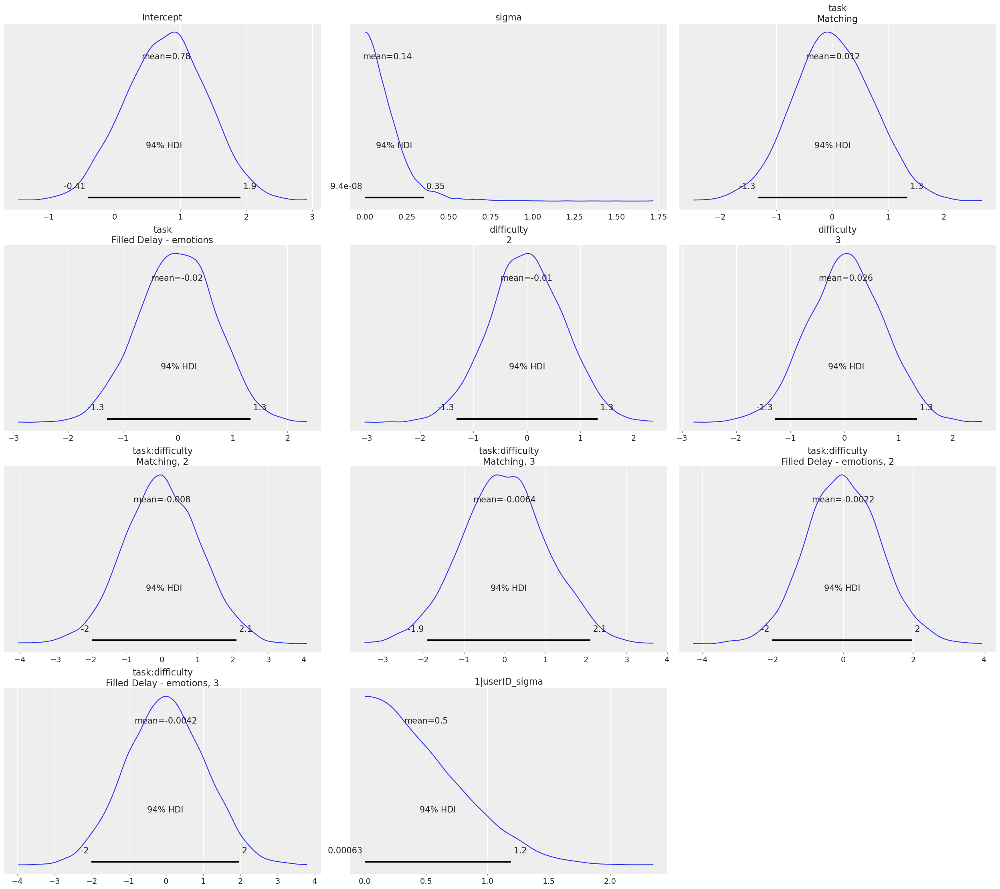

In [8]:
model_dic_bernoulli[f][formulas2run[0]].plot_priors()

Sampling: [1|userID_sigma, Intercept, difficulty, sigma, task]


array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'task\nMatching'}>],
       [<Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': '1|userID_sigma'}>, <Axes: >, <Axes: >]],
      dtype=object)

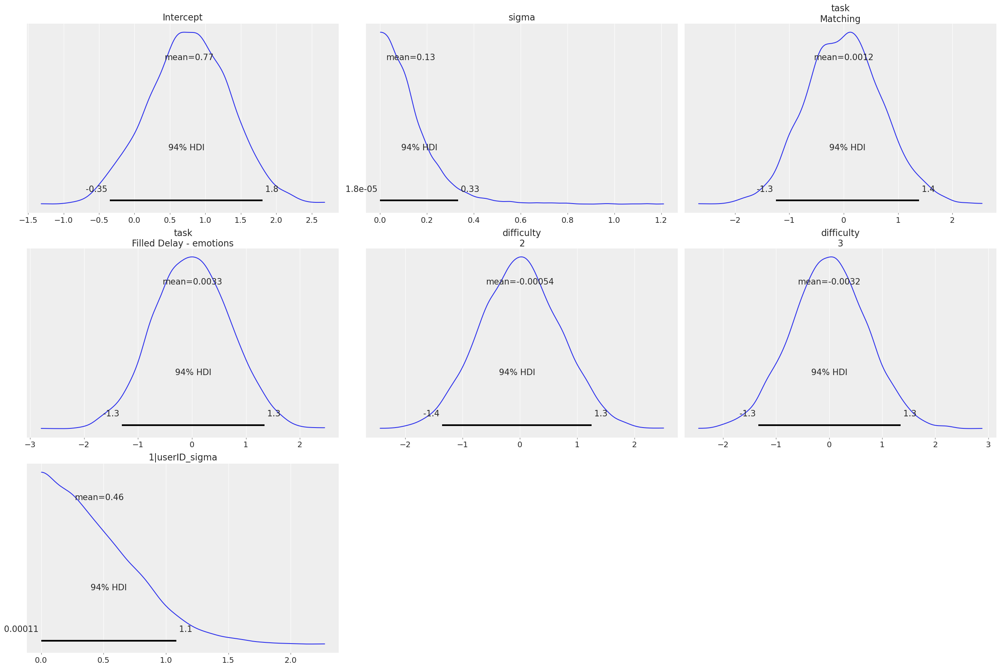

In [9]:
model_dic_bernoulli[f][formulas2run[1]].plot_priors()

### check posterior

array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'task\nMatching'}>,
        <Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: >]], dtype=object)

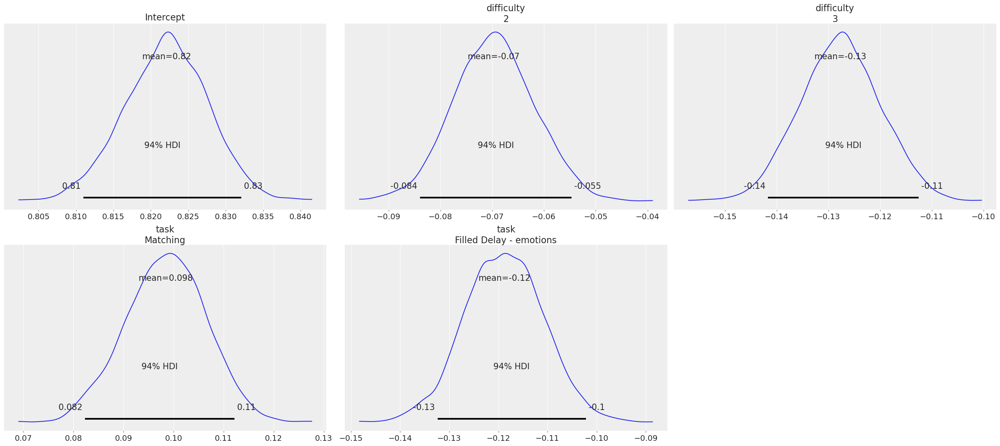

In [10]:
az.plot_posterior(result_dic_bernoulli[f][formulas2run[0]], 
                  var_names=['Intercept', 'difficulty', 'task'],#, 'task:difficulty'],
                  hdi_prob=.94)

array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'task\nMatching'}>,
        <Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: >]], dtype=object)

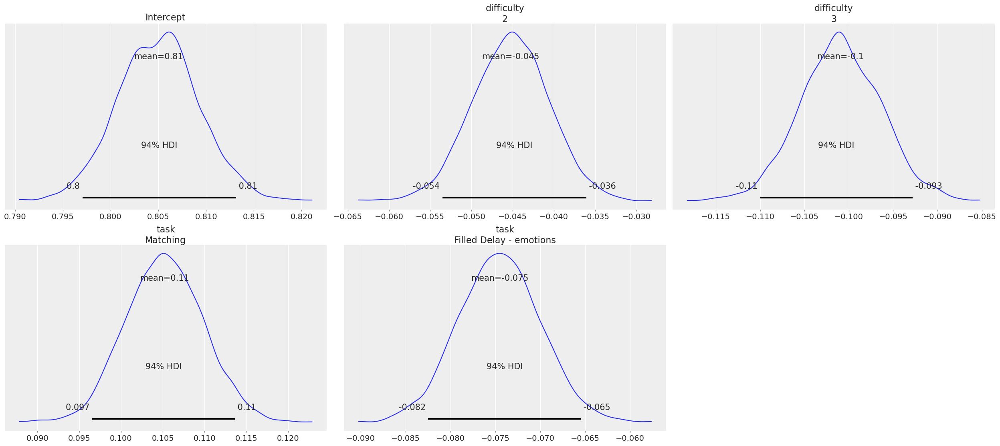

In [11]:
az.plot_posterior(result_dic_bernoulli[f][formulas2run[1]], 
                  var_names=['Intercept', 'difficulty', 'task'],#, 'task:difficulty'],
                  hdi_prob=.94)

---
## Plot results

## FMP dataset 1
[top](#top)


Dataset: dataset_1

Fitting formula correct_flt ~ task * difficulty + (1|userID)



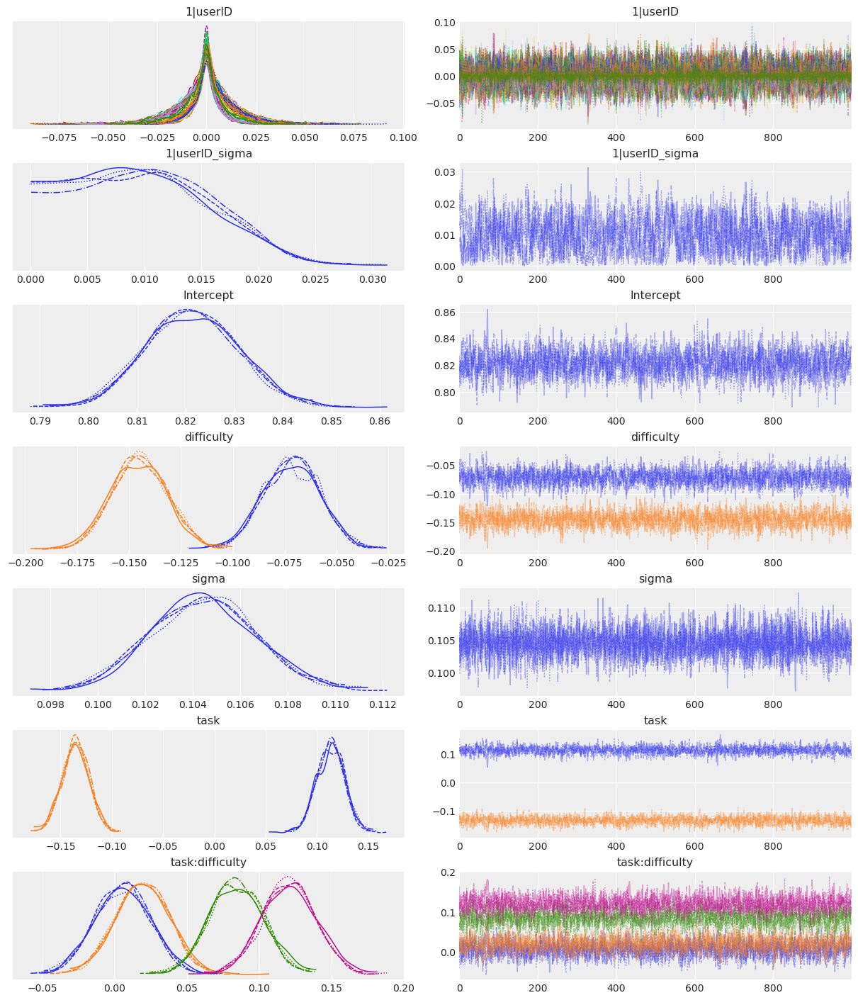

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1000]  0.000  0.010  -0.020    0.022        0.0      0.0    5059.0   
1|userID[s_1014] -0.004  0.011  -0.026    0.017        0.0      0.0    4365.0   
1|userID[s_1027] -0.001  0.010  -0.021    0.019        0.0      0.0    5275.0   
1|userID[s_1032] -0.004  0.011  -0.026    0.017        0.0      0.0    3308.0   
1|userID[s_1057] -0.002  0.010  -0.023    0.019        0.0      0.0    4552.0   
1|userID[s_1060] -0.005  0.012  -0.028    0.015        0.0      0.0    3028.0   
1|userID[s_1061]  0.004  0.011  -0.014    0.030        0.0      0.0    3781.0   
1|userID[s_1067]  0.004  0.011  -0.013    0.028        0.0      0.0    3474.0   
1|userID[s_107]   0.003  0.010  -0.017    0.024        0.0      0.0    4152.0   
1|userID[s_1084] -0.004  0.011  -0.026    0.017        0.0      0.0    4298.0   
1|userID[s_1091] -0.000  0.010  -0.019    0.021        0.0      0.0    4209.0   
1|userID[s_1093]  0.005  0.0

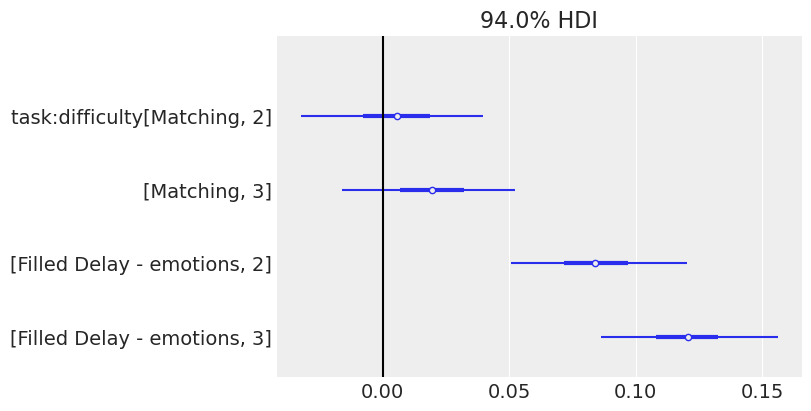

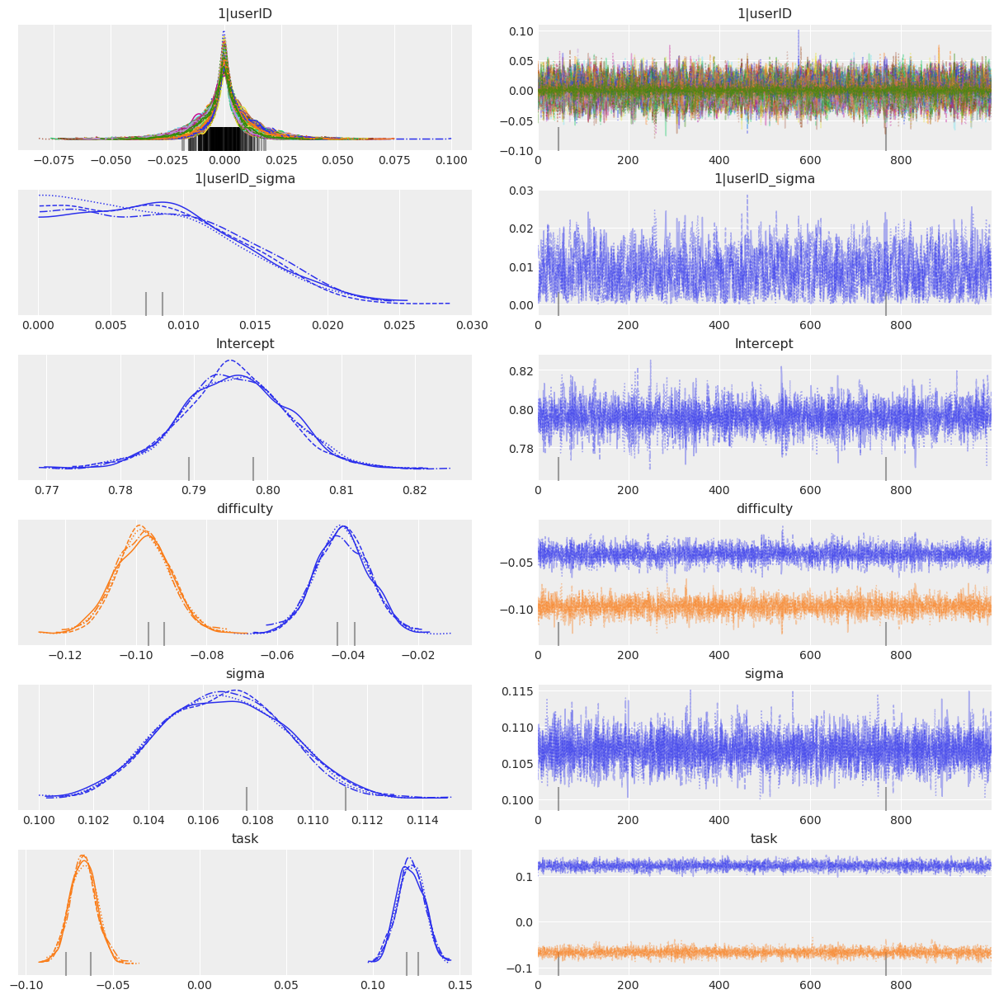

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1000]  0.000  0.009  -0.019    0.020        0.0      0.0    4708.0   
1|userID[s_1014] -0.003  0.010  -0.023    0.016        0.0      0.0    4269.0   
1|userID[s_1027] -0.001  0.010  -0.022    0.017        0.0      0.0    4820.0   
1|userID[s_1032] -0.003  0.010  -0.024    0.016        0.0      0.0    3924.0   
1|userID[s_1057] -0.002  0.010  -0.023    0.018        0.0      0.0    3974.0   
1|userID[s_1060] -0.004  0.010  -0.025    0.014        0.0      0.0    4039.0   
1|userID[s_1061]  0.004  0.010  -0.015    0.024        0.0      0.0    3529.0   
1|userID[s_1067]  0.003  0.010  -0.014    0.024        0.0      0.0    3847.0   
1|userID[s_107]   0.002  0.009  -0.014    0.023        0.0      0.0    4302.0   
1|userID[s_1084] -0.003  0.010  -0.023    0.015        0.0      0.0    3793.0   
1|userID[s_1091] -0.001  0.009  -0.019    0.019        0.0      0.0    4939.0   
1|userID[s_1093]  0.004  0.0

In [12]:
f = 'dataset_1'
print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP dataset 2 -- randomised stimuli matched for entropy
[top](#top)


Dataset: dataset_2

Fitting formula correct_flt ~ task * difficulty + (1|userID)



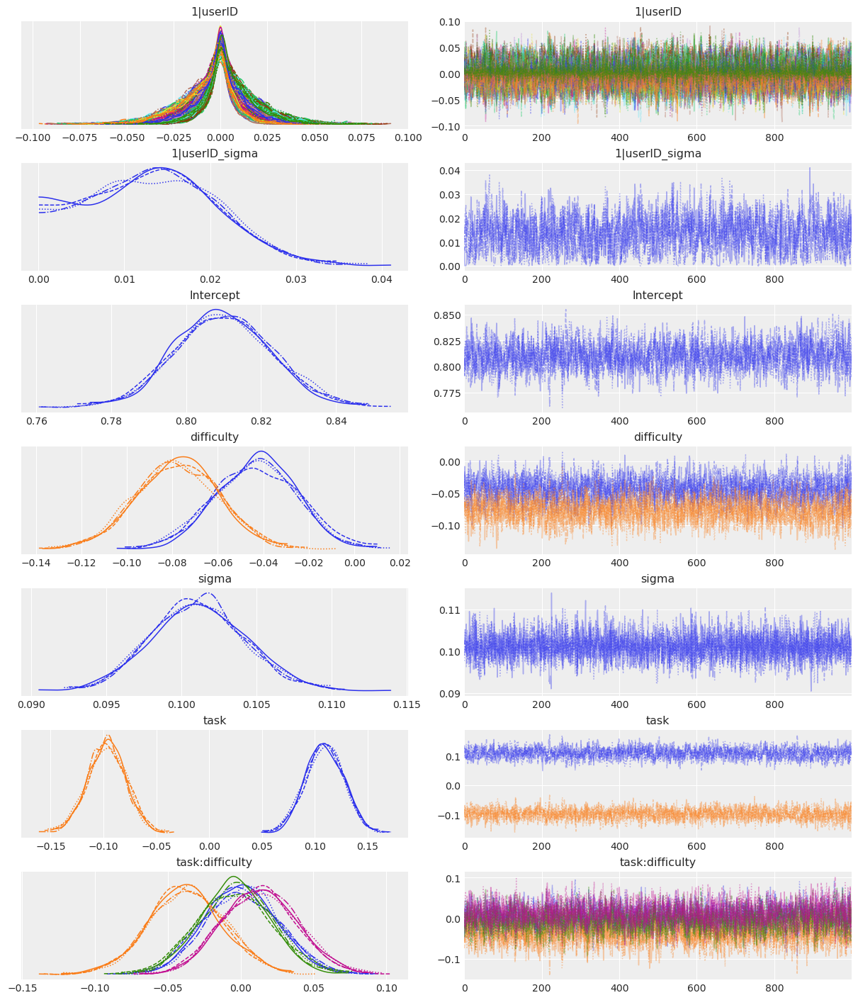

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1026] -0.007  0.014  -0.039    0.016        0.0      0.0    3748.0   
1|userID[s_1048]  0.004  0.014  -0.021    0.032        0.0      0.0    4697.0   
1|userID[s_105]   0.007  0.015  -0.020    0.036        0.0      0.0    3734.0   
1|userID[s_1081] -0.008  0.014  -0.038    0.016        0.0      0.0    2957.0   
1|userID[s_1103]  0.008  0.015  -0.016    0.042        0.0      0.0    3315.0   
1|userID[s_1122] -0.009  0.015  -0.040    0.016        0.0      0.0    3123.0   
1|userID[s_123]  -0.003  0.013  -0.029    0.022        0.0      0.0    5067.0   
1|userID[s_152]  -0.009  0.015  -0.041    0.016        0.0      0.0    3066.0   
1|userID[s_160]   0.003  0.013  -0.022    0.031        0.0      0.0    4534.0   
1|userID[s_164]  -0.003  0.014  -0.032    0.022        0.0      0.0    5061.0   
1|userID[s_169]  -0.004  0.014  -0.033    0.021        0.0      0.0    4703.0   
1|userID[s_191]  -0.010  0.0

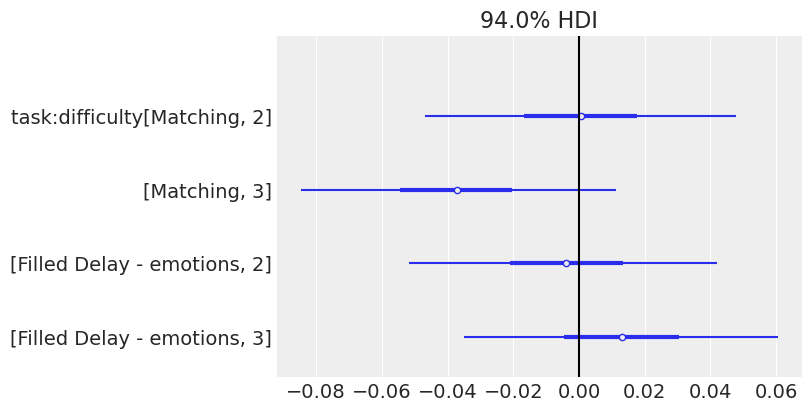

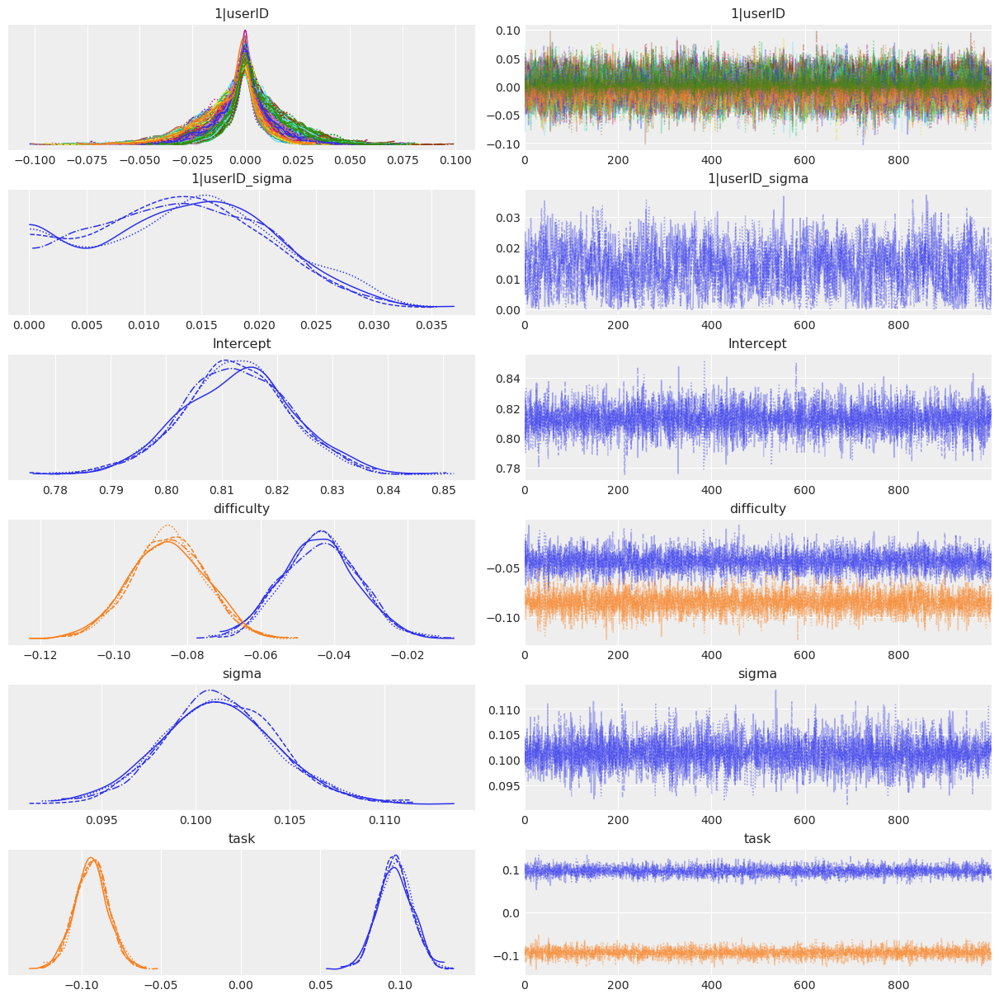

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1026] -0.008  0.014  -0.037    0.017        0.0      0.0    3627.0   
1|userID[s_1048]  0.004  0.014  -0.019    0.033        0.0      0.0    4922.0   
1|userID[s_105]   0.008  0.015  -0.017    0.039        0.0      0.0    3730.0   
1|userID[s_1081] -0.008  0.014  -0.037    0.017        0.0      0.0    3263.0   
1|userID[s_1103]  0.009  0.015  -0.017    0.040        0.0      0.0    3623.0   
1|userID[s_1122] -0.009  0.015  -0.043    0.015        0.0      0.0    2705.0   
1|userID[s_123]  -0.003  0.014  -0.031    0.024        0.0      0.0    5333.0   
1|userID[s_152]  -0.009  0.015  -0.040    0.016        0.0      0.0    3647.0   
1|userID[s_160]   0.004  0.013  -0.022    0.030        0.0      0.0    5325.0   
1|userID[s_164]  -0.004  0.013  -0.031    0.021        0.0      0.0    5511.0   
1|userID[s_169]  -0.005  0.014  -0.033    0.022        0.0      0.0    4859.0   
1|userID[s_191]  -0.010  0.0

In [13]:
f = 'dataset_2'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP dataset 3 -- randomising cue stimulus 
[top](#top)

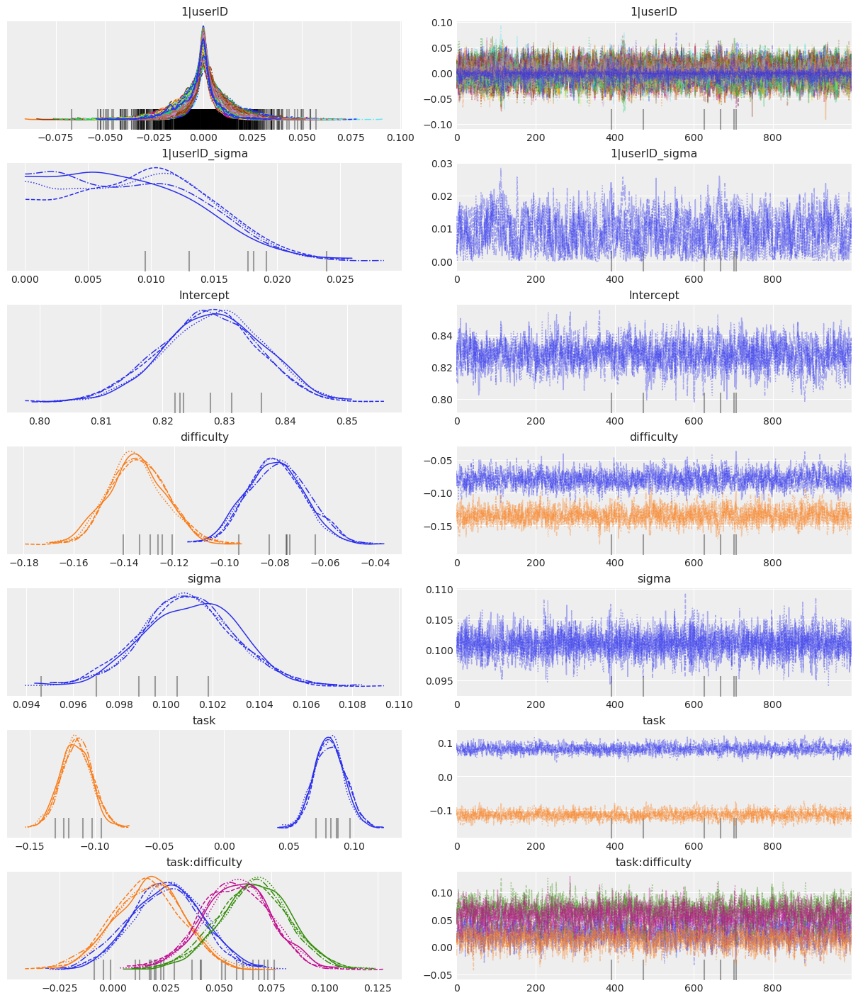

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1001]  0.002  0.010  -0.016    0.023        0.0      0.0    2954.0   
1|userID[s_1006]  0.002  0.009  -0.016    0.022        0.0      0.0    2999.0   
1|userID[s_1012] -0.004  0.011  -0.025    0.015        0.0      0.0    2344.0   
1|userID[s_1015] -0.002  0.009  -0.021    0.017        0.0      0.0    3547.0   
1|userID[s_1016]  0.001  0.010  -0.017    0.022        0.0      0.0    3510.0   
1|userID[s_1036]  0.003  0.010  -0.015    0.025        0.0      0.0    2982.0   
1|userID[s_1042] -0.001  0.010  -0.022    0.017        0.0      0.0    3215.0   
1|userID[s_1045]  0.005  0.011  -0.013    0.028        0.0      0.0    2351.0   
1|userID[s_1046] -0.002  0.010  -0.021    0.019        0.0      0.0    2844.0   
1|userID[s_1047]  0.001  0.010  -0.018    0.020        0.0      0.0    3123.0   
1|userID[s_1065] -0.002  0.010  -0.025    0.018        0.0      0.0    3141.0   
1|userID[s_1069] -0.003  0.0

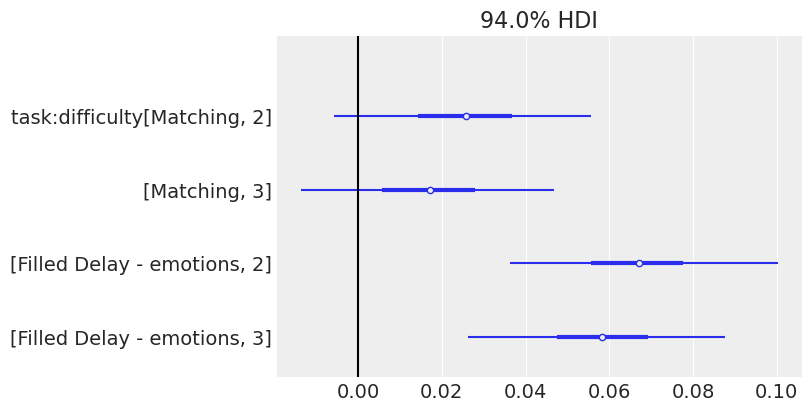

In [14]:
f = 'dataset_3'
print_model(model_dic_bernoulli[f][formulas2run[0]], result_dic_bernoulli[f][formulas2run[0]])

Dataset: dataset_3

Fitting formula correct_flt ~ task * difficulty + (1|userID)



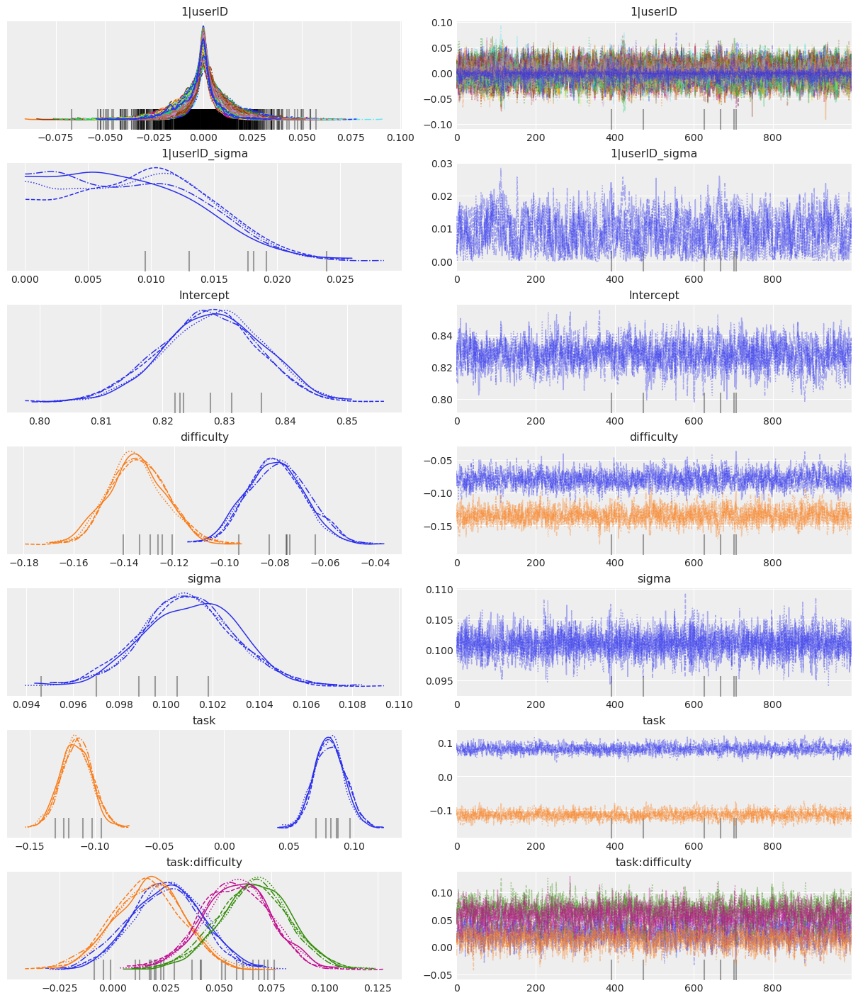

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1001]  0.002  0.010  -0.016    0.023        0.0      0.0    2954.0   
1|userID[s_1006]  0.002  0.009  -0.016    0.022        0.0      0.0    2999.0   
1|userID[s_1012] -0.004  0.011  -0.025    0.015        0.0      0.0    2344.0   
1|userID[s_1015] -0.002  0.009  -0.021    0.017        0.0      0.0    3547.0   
1|userID[s_1016]  0.001  0.010  -0.017    0.022        0.0      0.0    3510.0   
1|userID[s_1036]  0.003  0.010  -0.015    0.025        0.0      0.0    2982.0   
1|userID[s_1042] -0.001  0.010  -0.022    0.017        0.0      0.0    3215.0   
1|userID[s_1045]  0.005  0.011  -0.013    0.028        0.0      0.0    2351.0   
1|userID[s_1046] -0.002  0.010  -0.021    0.019        0.0      0.0    2844.0   
1|userID[s_1047]  0.001  0.010  -0.018    0.020        0.0      0.0    3123.0   
1|userID[s_1065] -0.002  0.010  -0.025    0.018        0.0      0.0    3141.0   
1|userID[s_1069] -0.003  0.0

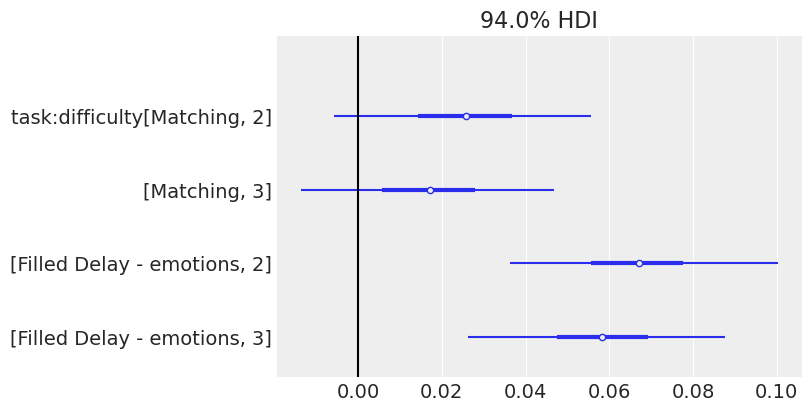

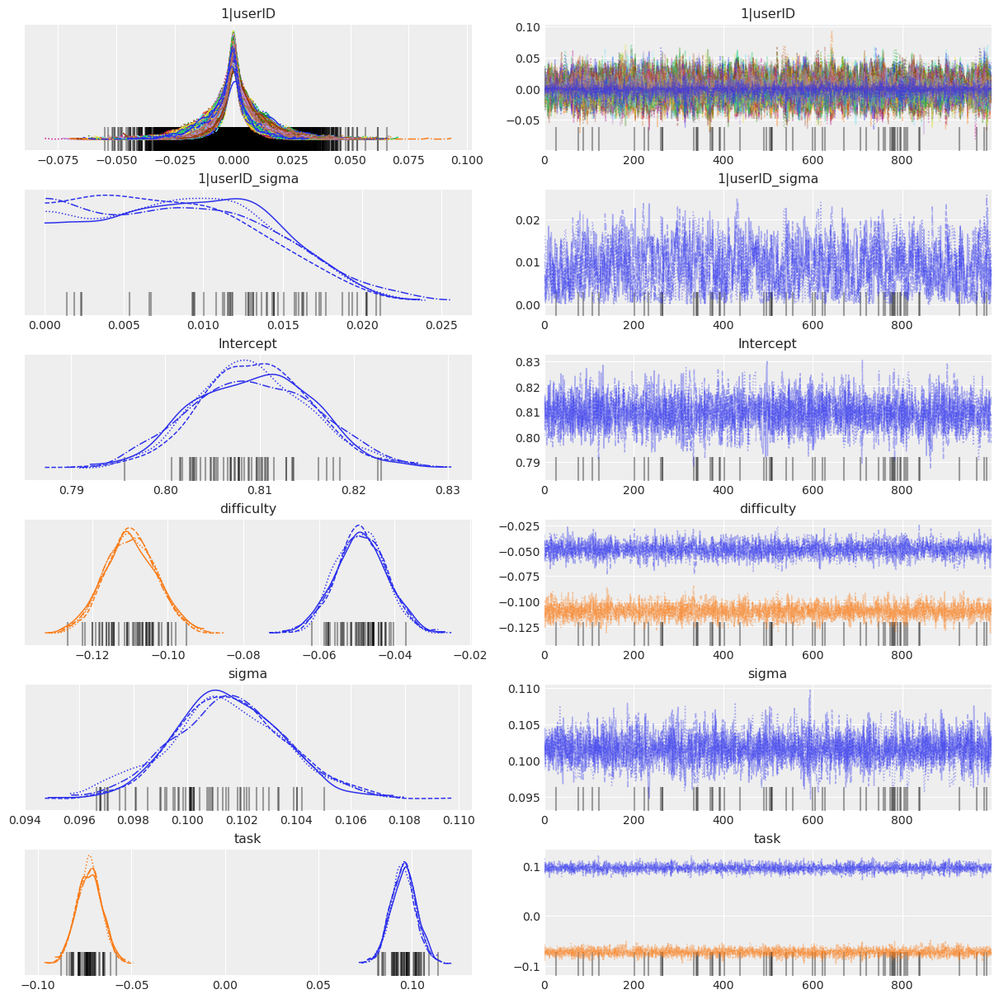

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1001]  0.002  0.009  -0.016    0.020        0.0      0.0    2635.0   
1|userID[s_1006]  0.003  0.010  -0.017    0.022        0.0      0.0    1825.0   
1|userID[s_1012] -0.003  0.010  -0.023    0.016        0.0      0.0    1921.0   
1|userID[s_1015] -0.001  0.009  -0.020    0.017        0.0      0.0    2161.0   
1|userID[s_1016]  0.001  0.010  -0.017    0.021        0.0      0.0    1400.0   
1|userID[s_1036]  0.002  0.010  -0.018    0.024        0.0      0.0    2228.0   
1|userID[s_1042] -0.001  0.010  -0.023    0.017        0.0      0.0    2605.0   
1|userID[s_1045]  0.005  0.011  -0.015    0.025        0.0      0.0    1461.0   
1|userID[s_1046] -0.002  0.010  -0.024    0.017        0.0      0.0    1781.0   
1|userID[s_1047]  0.001  0.010  -0.020    0.020        0.0      0.0    2223.0   
1|userID[s_1065] -0.002  0.010  -0.020    0.019        0.0      0.0    2303.0   
1|userID[s_1069] -0.003  0.0

In [15]:
f = 'dataset_3'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP concatenated dataset 1, 2, 3
[top](#top)


Dataset: concat_datasets_123

Fitting formula correct_flt ~ task * difficulty + (1|userID)



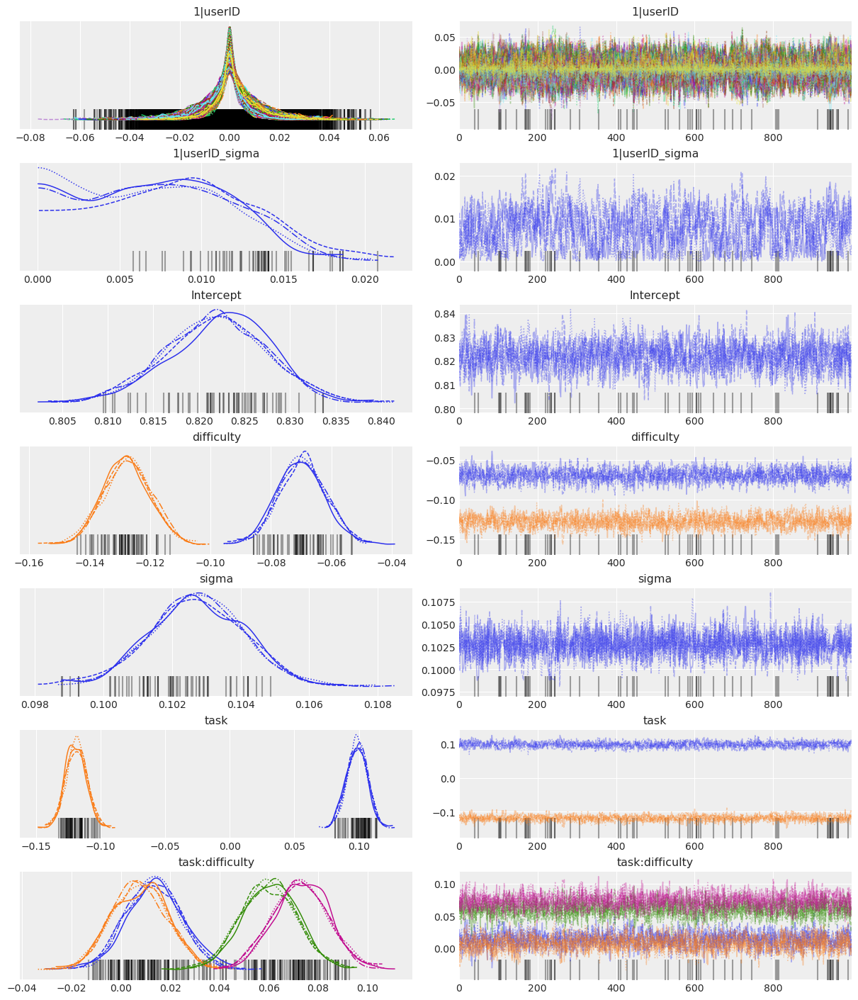

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1000]  0.000  0.009  -0.017    0.017        0.0      0.0    2119.0   
1|userID[s_1001]  0.001  0.008  -0.014    0.019        0.0      0.0    2192.0   
1|userID[s_1006]  0.002  0.009  -0.014    0.021        0.0      0.0    2052.0   
1|userID[s_1012] -0.003  0.008  -0.022    0.011        0.0      0.0    2027.0   
1|userID[s_1014] -0.002  0.009  -0.021    0.014        0.0      0.0     964.0   
1|userID[s_1015] -0.001  0.009  -0.020    0.016        0.0      0.0    1945.0   
1|userID[s_1016]  0.001  0.009  -0.016    0.020        0.0      0.0    1658.0   
1|userID[s_1026] -0.003  0.009  -0.021    0.014        0.0      0.0    1444.0   
1|userID[s_1027] -0.001  0.008  -0.017    0.016        0.0      0.0    1755.0   
1|userID[s_1032] -0.003  0.009  -0.021    0.014        0.0      0.0    1854.0   
1|userID[s_1036]  0.002  0.008  -0.014    0.019        0.0      0.0    2271.0   
1|userID[s_1042] -0.000  0.0

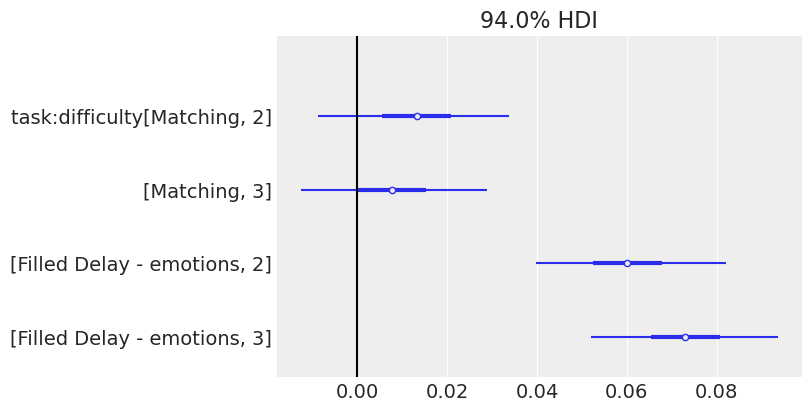

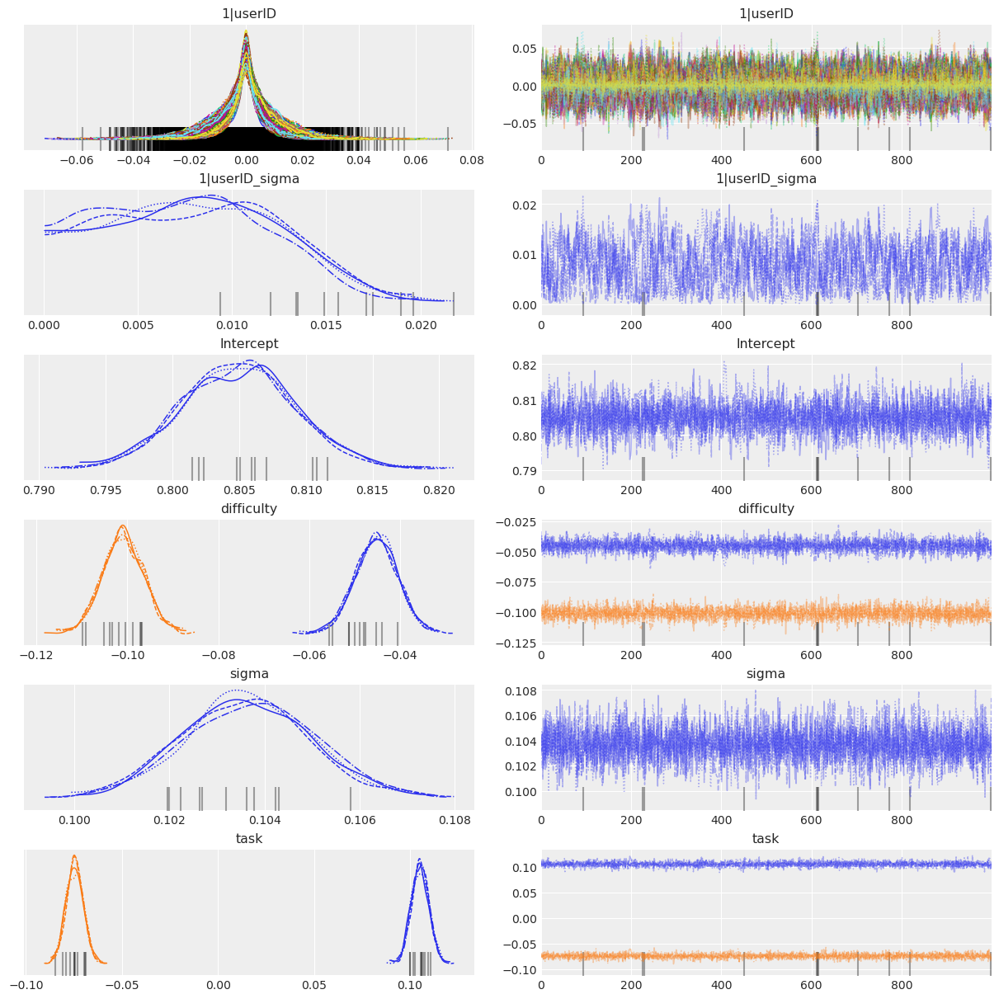

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1000]  0.001  0.009  -0.016    0.019        0.0      0.0    4194.0   
1|userID[s_1001]  0.001  0.009  -0.016    0.019        0.0      0.0    3829.0   
1|userID[s_1006]  0.002  0.009  -0.015    0.021        0.0      0.0    3362.0   
1|userID[s_1012] -0.003  0.009  -0.021    0.013        0.0      0.0    3141.0   
1|userID[s_1014] -0.003  0.009  -0.021    0.014        0.0      0.0    2898.0   
1|userID[s_1015] -0.001  0.009  -0.017    0.017        0.0      0.0    3108.0   
1|userID[s_1016]  0.001  0.009  -0.018    0.018        0.0      0.0    3090.0   
1|userID[s_1026] -0.003  0.009  -0.021    0.013        0.0      0.0    2964.0   
1|userID[s_1027] -0.001  0.009  -0.018    0.017        0.0      0.0    3024.0   
1|userID[s_1032] -0.003  0.008  -0.020    0.013        0.0      0.0    3046.0   
1|userID[s_1036]  0.002  0.009  -0.014    0.020        0.0      0.0    3172.0   
1|userID[s_1042] -0.001  0.0

In [16]:
f = 'concat_datasets_123'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

### Compare all data
[top](#top)

dataset_1 

                                              rank    elpd_loo      p_loo  \
correct_flt ~ task * difficulty + (1|userID)     0  919.707869  21.178881   
correct_flt ~ task + difficulty + (1|userID)     1  898.874128  14.592490   

                                              elpd_diff    weight         se  \
correct_flt ~ task * difficulty + (1|userID)   0.000000  0.876352  23.256577   
correct_flt ~ task + difficulty + (1|userID)  20.833741  0.123648  23.585508   

                                                   dse  warning scale  
correct_flt ~ task * difficulty + (1|userID)  0.000000    False   log  
correct_flt ~ task + difficulty + (1|userID)  7.462752    False   log  

dataset_2 

                                              rank    elpd_loo      p_loo  \
correct_flt ~ task + difficulty + (1|userID)     0  485.925169  16.462494   
correct_flt ~ task * difficulty + (1|userID)     1  484.809066  20.180367   

                                              elpd_dif

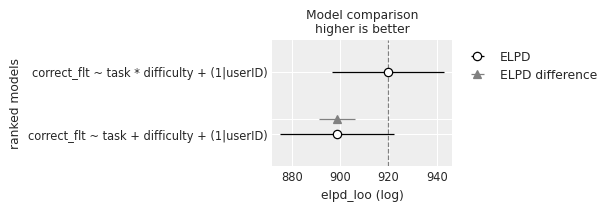

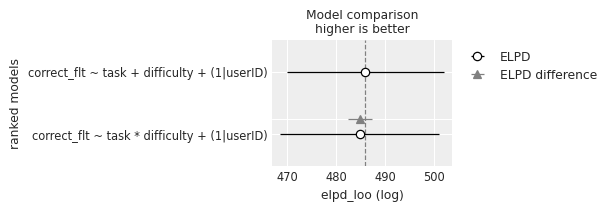

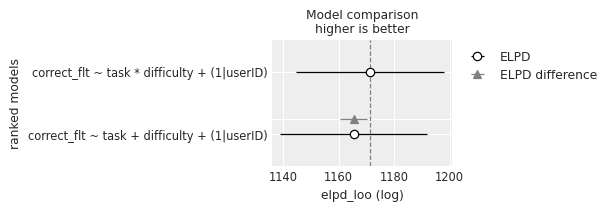

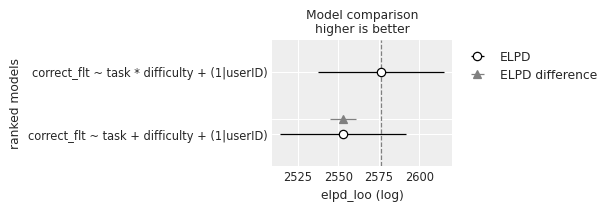

In [17]:
df_compare_formulas_bernoulli = {}
for f in result_dic_bernoulli.keys():
    print(f, '\n')
    df_compare_formulas_bernoulli[f] = az.compare(result_dic_bernoulli[f])
    
    print(df_compare_formulas_bernoulli[f])
    
    az.plot_compare(df_compare_formulas_bernoulli[f], insample_dev=False);

    
    print()
# df_compare_formulas_bernoulli[f]

Text(0.5, 0.98, 'Model comparison\nhigher is better')

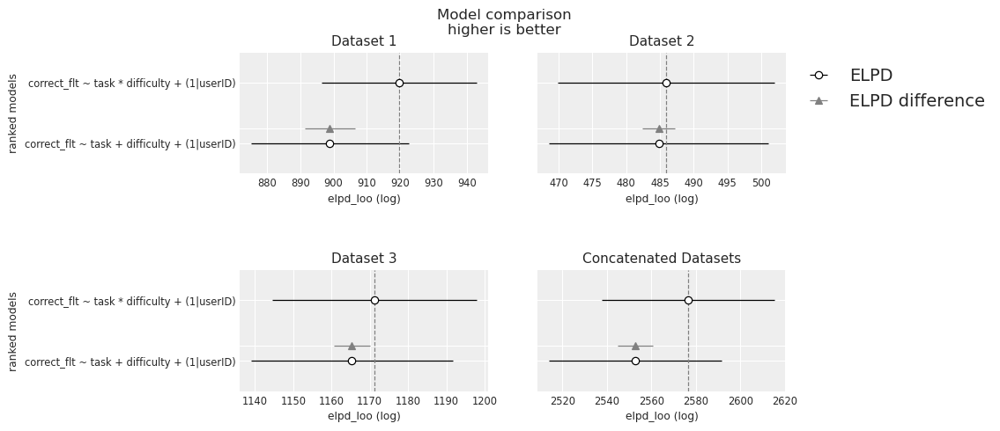

In [18]:
fig, axs = plt.subplots(2,2, figsize=(8,5), sharey=True, constrained_layout=False)
plt.subplots_adjust(hspace=0.8)

for (i,f),ax in zip(enumerate(df_compare_formulas_bernoulli.keys()), axs.flatten()):
    az.plot_compare(df_compare_formulas_bernoulli[f], insample_dev=False, ax=ax)
    
    if i==1:
        ax.legend(bbox_to_anchor=(1,1))
    else:
        ax.legend_.remove()

    if i%2==1:
        ax.set_ylabel('')
        
    t = ax.get_title()
    ax.set_title(f.replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title(), fontsize=11)
    
plt.suptitle(t)

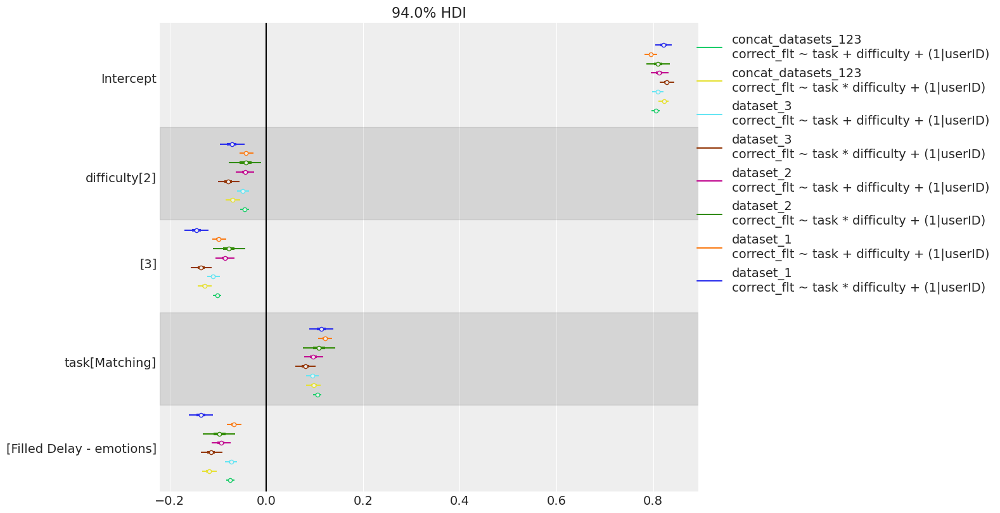

In [19]:
fig, ax = plt.subplots(figsize=(14, 8))

az.plot_forest(
    list(result_dic_bernoulli['dataset_1'].values())+\
    list(result_dic_bernoulli['dataset_2'].values())+\
    list(result_dic_bernoulli['dataset_3'].values())+\
    list(result_dic_bernoulli['concat_datasets_123'].values()),
    model_names=[f'{f}\n{formula}' for f in result_dic_bernoulli.keys() for formula in formulas2run],
    var_names=["Intercept", "difficulty", "task"],
    combined=True,
    ax=ax
)

ax.axvline(0, c='k')

# manually adjust the legend, there is some weird bug
legend = ax.get_legend()
labels = [] if legend is None else [str(x._text) for x in legend.texts]
handles = [] if legend is None else legend.legend_handles
ax.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.56, 1), ncols=1)
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()



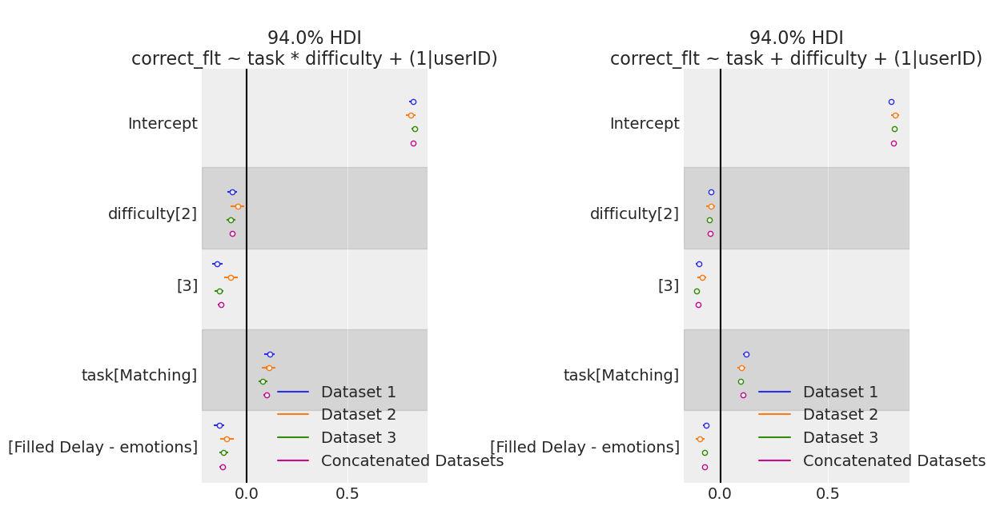

In [20]:
fig, axs = plt.subplots(1,2, figsize=(12, 6))

for i, ax in enumerate(axs.flatten()):
    az.plot_forest(
        (list(result_dic_bernoulli['dataset_1'].values())+\
        list(result_dic_bernoulli['dataset_2'].values())+\
        list(result_dic_bernoulli['dataset_3'].values())+\
        list(result_dic_bernoulli['concat_datasets_123'].values())
    )[i::2],
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["Intercept", "difficulty", "task"],
        combined=True,
        ax=ax
    )
        
    ax.set_title(f'{ax.get_title()}\n{formulas2run[i]}')

    ax.axvline(0, c='k')

    # manually adjust the legend, there is some weird bug
    legend = ax.get_legend()
    labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title() for x in legend.texts]
    handles = [] if legend is None else legend.legend_handles
    # reorder the legend
    ax.legend(handles[::-1], labels[::-1], loc="lower right", bbox_to_anchor=(1.4, 0))
    
    
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()



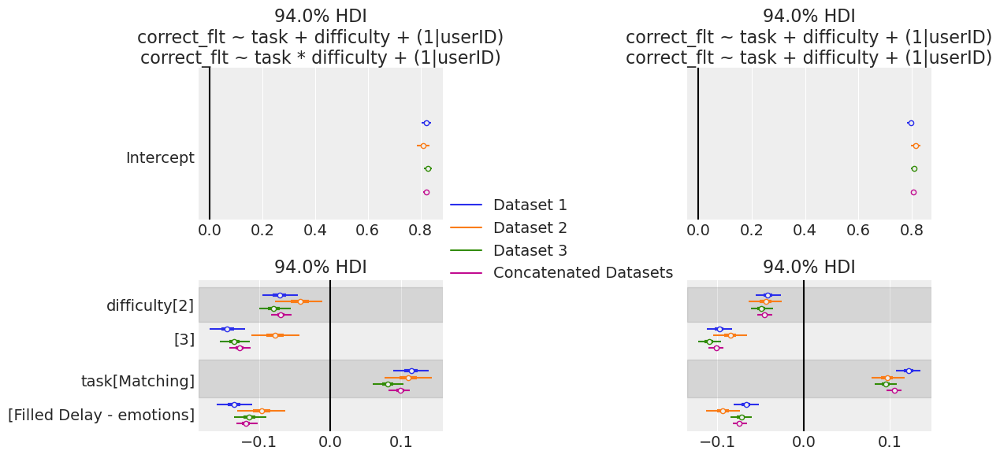

In [21]:
fig, axs = plt.subplots(2, 2, figsize=(12, 6), sharey='row', constrained_layout=False)

plt.subplots_adjust(wspace=1., hspace=0.4)

for i in range(2):

    models = (
        list(result_dic_bernoulli['dataset_1'].values()) +
        list(result_dic_bernoulli['dataset_2'].values()) +
        list(result_dic_bernoulli['dataset_3'].values()) +
        list(result_dic_bernoulli['concat_datasets_123'].values())
    )[i::2]

    # Plot 'Intercept' separately
    az.plot_forest(
        models,  # Only Intercept
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["Intercept"],
        combined=True,
        ax=axs[0,i]
    )

    # Plot other variables
    az.plot_forest(
        models,
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["difficulty", "task"],
        combined=True,
        ax=axs[1,i]
    )

    axs[0,i].set_title(f'{ax.get_title()}\n{formulas2run[i]}')
    
    
for i, ax in enumerate(axs.flatten()):
    ax.axvline(0, c='k')
    
    if i==0:
        # Manually adjust the legend
        legend = ax.get_legend()
        labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_', ' ').title() for x in legend.texts]
        handles = [] if legend is None else legend.legend_handles
        ax.legend(handles[::-1], labels[::-1], loc="lower right", bbox_to_anchor=(2., -.5))
        
    else:
        ax.legend_.remove()

# # Add title and vertical line to the intercept subplot
# intercept_ax.set_title("Intercept")
# intercept_ax.axvline(0, c='k')

plt.show()


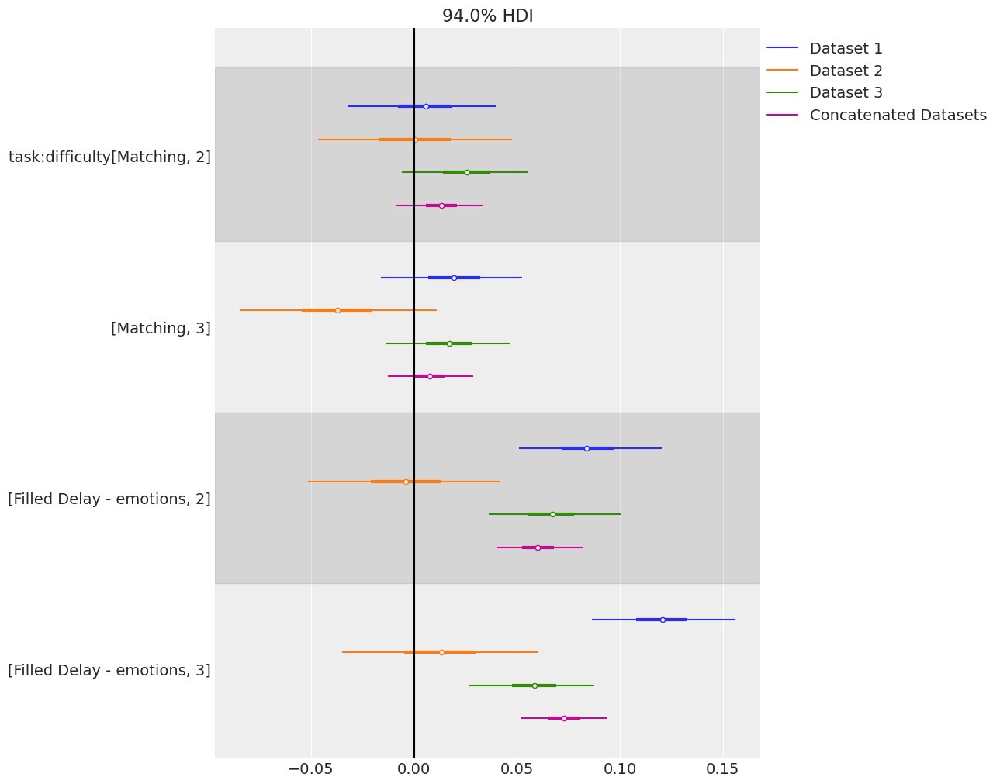

In [22]:

fig, ax = plt.subplots(figsize=(12, 10))

az.plot_forest(
    (list(result_dic_bernoulli['dataset_1'].values())+\
    list(result_dic_bernoulli['dataset_2'].values())+\
    list(result_dic_bernoulli['dataset_3'].values())+\
    list(result_dic_bernoulli['concat_datasets_123'].values())
    )[::2],
    model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
    var_names=["task:difficulty"],
    combined=True,
    ax=ax
)

ax.axvline(0, c='k')

# plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
# # plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
# plt.show()


# manually adjust the legend, there is some weird bug
legend = ax.get_legend()
labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title() for x in legend.texts]
handles = [] if legend is None else legend.legend_handles
ax.legend(handles[::-1], labels[::-1], loc="upper right", bbox_to_anchor=(1.44, 1))
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()

### Run some predictions
[top](#top)

In [23]:
interactions = ['Matching, 2', 'Matching, 3', 'Filled Delay - emotions, 2', 'Filled Delay - emotions, 3']
fm2, fm3, i2, i3 = [result_dic_bernoulli[f]['correct_flt ~ task * difficulty + (1|userID)'].posterior["task:difficulty"].sel({"task:difficulty_dim":tsk}) for tsk in interactions]



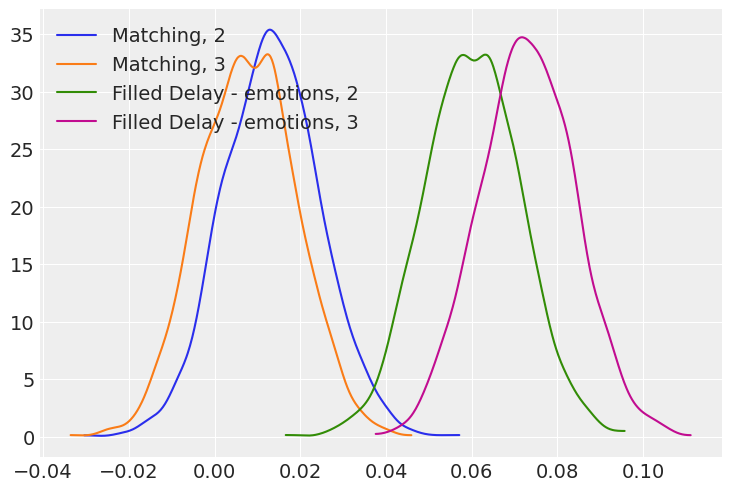

In [24]:
_, ax = plt.subplots()
for idx, x in enumerate([fm2, fm3, i2, i3]):
    az.plot_dist(x, label=x["task:difficulty_dim"].item(), plot_kwargs={"color": f"C{idx}"}, ax=ax)
ax.legend(loc="upper left");

In [25]:
# Probability that the FM slope is less than 0

print(f"""
Probability that the M slope is less than 0:
level 2: {(fm2 < 0).mean().item()}
level 3: {(fm3 < 0).mean().item()}
""")


Probability that the M slope is less than 0:
level 2: 0.115
level 3: 0.258



---

In [26]:
for f in result_dic_bernoulli.keys():

    fm2, fm3, i2, i3 = [result_dic_bernoulli[f]['correct_flt ~ task * difficulty + (1|userID)'].posterior["task:difficulty"].sel({"task:difficulty_dim":tsk}) for tsk in interactions]
    print(f"""
Experiment {f}:
  Probability that the M slope is less than 0:
    level 2: {(fm2 < 0).mean().item()}
    level 3: {(fm3 < 0).mean().item()}
    
  Probability that the FD-e slope is less than 0:
    level 2: {(i2 < 0).mean().item()}
    level 3: {(i3 < 0).mean().item()}
    
    """)


Experiment dataset_1:
  Probability that the M slope is less than 0:
    level 2: 0.38575
    level 3: 0.14625
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    

Experiment dataset_2:
  Probability that the M slope is less than 0:
    level 2: 0.4915
    level 3: 0.924
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.55625
    level 3: 0.31325
    
    

Experiment dataset_3:
  Probability that the M slope is less than 0:
    level 2: 0.068
    level 3: 0.15375
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    

Experiment concat_datasets_123:
  Probability that the M slope is less than 0:
    level 2: 0.115
    level 3: 0.258
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    


### Save the inference
[top](#top)

It could be possible to use this:
```
result_dic_bernoulli['dataset_1']['correct_flt ~ task * difficulty + (1|userID)'].to_netcdf()
```

and the other datasets that were fitted, but it doesn't preserve the dictionary, so I use pickle.

In [31]:
# save the dictionary to a pickle file
with open(opj(path_inference_data,f'FMP_Floor_{int(top_thr*100)}-{int((1-top_thr)*100)}_overall_inference_data_dict.pkl'), 'wb') as f:
    pickle.dump(result_dic_bernoulli, f)

In [28]:
# # Load the dictionary from the pickle file
# with open(opj(path_inference_data,'FMP_Figure_2_inference_data_dict.pkl'), 'rb') as f:
#     loaded_inference_data_dict = pickle.load(f)


In [29]:
%load_ext watermark

%watermark -a 'Jan Kadlec' -nmvu -iv -iv -w -p pytensor


Author: Jan Kadlec

Last updated: Fri May 16 2025

Python implementation: CPython
Python version       : 3.12.5
IPython version      : 8.25.0

pytensor: 2.23.0

Compiler    : GCC 12.4.0
OS          : Linux
Release     : 5.14.0-427.42.1.el9_4.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 96
Architecture: 64bit

arviz     : 0.19.0
pandas    : 2.2.2
matplotlib: 3.9.2
sys       : 3.12.5 | packaged by conda-forge | (main, Aug  8 2024, 18:36:51) [GCC 12.4.0]
numpy     : 1.26.4
bambi     : 0.14.0

Watermark: 2.4.3



[top](#top)